In [1]:
import numpy as np
import pandas as pd
import random
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from mpl_toolkits import mplot3d
%matplotlib inline
from tqdm import tqdm
from mpl_toolkits.mplot3d import Axes3D
import time

In [2]:
random.seed(1852026)

In [3]:
df = pd.read_excel("dataPoints.xlsx")
data = df.to_numpy()#change to matrix

You have to randomly split the data set into a training set, a validation set and a test set. Suggested
percentages for this split are 70 %, 15% and 15%, respectively, **but feel free to experiment
and change these numbers.**

Define train, test and validation set

In [4]:
def initializeParams(N):
    n=2
    n_y=1
    W = np.random.randn(N,n) 
    bias = np.random.randn(N,1) 
    V = np.random.randn(n_y,N) 
    a=pd.DataFrame(V.T)
    a[2]=W[:,0]
    a[3]=W[:,1]
    a[4]=bias
    omega=np.matrix(a)
    
 
   
    return W,bias,V,omega

In [5]:
data_train, data_rest = train_test_split(data, test_size=0.30)

In [6]:
data_test, data_validate = train_test_split(data_rest, test_size=0.50)

Create input vectors

In [7]:
X_train = np.transpose(data_train[:,0:2])
Y_train = np.transpose(data_train[:,2:])
X_validate = np.transpose(data_validate[:,0:2])
Y_validate = np.transpose(data_validate[:,2:])
X_test = np.transpose(data_test[:,0:2])
Y_test = np.transpose(data_test[:,2:])


n = X_train.shape[0] # Size of the input vector X
n_y = Y_train.shape[0] # Size of the input vector Y
P = X_train.shape[1] # Size of the sample
N = 10 # size of the hidden layer, # neurons, this is just for the moment to have some example

In [9]:
df.head()

,x1,x2,y
0,-1.262271,0.746859,0.461002
1,-0.804355,0.937081,0.617336
2,-1.805674,0.738389,-0.053984
3,-0.888805,0.061711,1.943678
4,-1.667562,-0.534543,2.127070


# Question 1. (Full minimization)

### MLP network

In [9]:
W,bias,V,omega=initializeParams(6)
ro=10**-5 #10-5 unti, 10-3
sigma=1
N=5

In [10]:
print(V,'\n')
print(W,'\n')
print(bias)

[[ 1.64625759  1.9918102   0.84991889 -0.68155371 -0.60804028  0.0327273 ]] 

[[ 0.80201274  0.72102458]
 [ 0.76763172 -0.50173818]
 [ 0.61374382  1.01481573]
 [-0.12041192 -1.09039774]
 [ 0.76032002  0.52508637]
 [-0.2537762  -1.0699869 ]] 

[[-0.76351954]
 [-0.55490358]
 [ 0.47961812]
 [-0.86091434]
 [ 0.1848714 ]
 [ 0.9898161 ]]


In [17]:
class MLP(object):
    
    def __init__(self, ro, sigma, N):
        self.ro = ro
        self.sigma = sigma 
        self.N = N

    def set_N(self, x): 
        self.N = x 
    def get_N(self): 
        return self.N     
    
    
    def second_norm(self,omega):
        return np.linalg.norm(omega)**2 

    def activation_f(self,t,sigma=1):
        return (np.exp(2*sigma*t)-1)/(np.exp(2*sigma*t)+1)

    def predict(self,omega,X):  

        '''
        r=omega.flatten().shape[0]
        try:
            c=omega.flatten().shape[1]

            N=int(omega.shape[1]/4)

        except:
                N=int(omega.shape[0]/4)
                
        '''     
        N=self.N
        V=omega.T[:N].reshape(1,N)
        W=omega.T[N:N+2*N].reshape(N,2)

        bias=omega.T[N+2*N:].reshape(N,1)

        t=W.dot(X)-bias


        predicted_values=V.dot(self.activation_f(t,sigma))
        return predicted_values#, W,bias




    def reg_tr_error(self,omega,functionArgs):
        X=functionArgs[0]
        true=functionArgs[1]
        
        '''
        r=omega.flatten().shape[0]
        
        try:
            c=omega.flatten().shape[1]

            N=int(omega.shape[1]/4)

        except:
                N=int(omega.shape[0]/4)

        '''
        predicted=self.predict(omega,X)


        err=np.array(predicted)-true #err_all=np.sum(np.array(predicted)-true)**2
        err_all=err.dot(err.T)


        P=X.shape[1]
        return ((err_all)/(2*P)+self.ro*self.second_norm(omega)).item(0)
    

  #  def get_params(self):
  #      return self.ro, self.sigma, self.N
    
  

In [12]:
W, bias, V, omega=initializeParams(7)
ro=10**-5 #10-5 unti, 10-3
sigma=1
N=7

In [13]:
mlp=MLP(ro,sigma,7)
mlp.reg_tr_error(omega.flatten(),[X_train,Y_train])

1.8656426747312773

In [14]:
mlp.get_N()

7

In [15]:
mlp.reg_tr_error(omega.flatten(),[X_train,Y_train])

1.8656426747312773

In [16]:
res=minimize(mlp.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='L-BFGS-B')
print(res['fun'],'\n',res['x'])

0.047036614129124917 
 [-6.90262063e+00 -4.23176092e+00 -7.59352532e+00 -8.08881647e-01
  3.89129798e+00 -3.73821843e-01  4.22605200e+00  6.61886285e-03
 -1.78535272e-01 -1.82104850e+00  3.30884198e-01  7.52903052e-01
  2.53869468e-01  2.40734477e-01 -4.55677498e+00 -3.48478964e+00
 -5.02759229e-01  2.29154684e+00 -9.60815921e-01  1.29725599e+00
 -6.51715239e-02  9.91219038e-01  2.83684982e+00 -5.79097876e-01
  1.51713036e+00  7.14143783e+00 -5.50092807e+00  5.16539554e-01]


In [17]:
res['x'].shape

(28,)

In [18]:
print(mlp.reg_tr_error(res['x'].flatten(),[X_validate,Y_validate,N]))
print(mlp.reg_tr_error(res['x'].flatten(),[X_test,Y_test,N]))

0.06577549260538854
0.042971398460598234


$$ E(\omega,\pi) = \frac{1}{2P}\sum_{p=1}^{P}(f(x^p)-y^p)^2+\rho \| \omega\|^2$$

Hyperparameters:
        
    the number of neurons N of the hidden layer
    the spread delta in the activation function g(t)
    the regularization parameter rho

## DRAFT VERSION OF THE ""HOMEMADE"" CROSS-VALIDATION METHOD

In [19]:
# the .fit method part is sort of missing cause choosing different configuratuons is needed


#repeated CROSS Validation

In [14]:
def second_norm_jac(omega): 
    return np.linalg.norm(omega)

def mse(true,predicted):
    return (np.sum(np.array(true-predicted)**2))/true.shape[1]


def calculate_test_err(cv_data,neurons,rho,sigma,omega):
    err=[]
    Mlp=MLP(rho,sigma,neurons)
    for i in range(10):
        X_train = np.transpose(np.matrix(cv_data)[:,0:2])
        Y_train = np.transpose(np.matrix(cv_data)[:,2:])
        #train on data train and data validate
        res=minimize(Mlp.reg_tr_error,omega.flatten(), args=[X_train,Y_train,N],method='L-BFGS-B')
        omega=res['x']
        #test on test data
        err.append(mse(Y_test,Mlp.predict(omega.flatten(),X_test)))
    return np.mean(err)

In [20]:
W,bias,V,omega=initializeParams(N=3)
omega.flatten()

matrix([[-1.56896589, -1.11320299, -1.9180341 ,  0.8527672 , -1.09985287,
         -0.10476966, -1.06518646, -1.08982048, -0.77974886,  0.8644176 ,
         -0.57190169,  1.07849274]])

In [21]:
def fivefoldCV(params):
    '''
    params a list N,rho,sigma
    '''
    global X_train, X_validate, X_test, Y_train, Y_validate, Y_test 

    K=5   # SO 4 folds for training 1-validation for testing; they switch every time
    cv_data=np.concatenate((data_train,data_validate))
    np.random.shuffle(cv_data)
    indices=np.arange(0,255,51)# [  0,  51, 102, 153, 204]
    folds=[]



  #  X=X_train

  #  true=Y_train

    N=params[0]
    rho=params[1]#10**-5 #10-5 unti, 10-3
    sigma=params[2]#1

    W,bias,V,omega=initializeParams(N)

    mlp=MLP(rho,sigma,N)


    P=cv_data.shape[0]

    mlp.set_N(N)
    
    #print(mlp.get_N())

    val_err_mse=[]
    train_err_mse=[]
    fun=[]
    jac_norm=[]
    init_tr_err=[]

    #train_err={}
    #val_err={}

    data=cv_data.copy()


    res_df=pd.DataFrame(columns=['neurons','rho','sigma','init_trr_err','fun','err_tr','jac_norm','err_val','err_test'])
    for i in range(len(indices)):
        cv_data=data
        if i<4:
            l=[i for i in range(indices[i],indices[i+1])]
            #(VALIDATION fold) for testing
            validate_cv=cv_data[indices[i]:indices[i+1],:]

            #train folds together for training
            df=pd.DataFrame(cv_data)
            train_cv=df.drop(df.index[l])



            X_train = np.transpose(np.matrix(train_cv)[:,0:2])
            Y_train = np.transpose(np.matrix(train_cv)[:,2:])
            X_validate = np.transpose(validate_cv[:,0:2])
            Y_validate = np.transpose(validate_cv[:,2:])
            init_tr_err.append( mse(Y_train,mlp.predict(omega.flatten(),X_train)))

            #print(omega.shape)
        #CHOSEN OMEGA? ->Fitting of the model
            res=minimize(mlp.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='L-BFGS-B')
     #       for i in range(10):
     #           omega=res['x']
     #           res=minimize(mlp.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='L-BFGS-B')
            
            omega=res['x']
            fun.append(res['fun'])
            jac_norm.append(second_norm_jac(res['jac'].T))

        #    err_tr=mse(reg_tr_error(omega.flatten(),[X_train,Y_train]))
            err_tr=mse(Y_train,mlp.predict(omega.flatten(),X_train))
            err_val=mse(Y_validate,mlp.predict(omega.flatten(),X_validate))

            train_err_mse.append(err_tr)
            val_err_mse.append(err_val)
            
             
           # train_err_dict[i]=
          #  val_err_dict[i]=mse(Y_validate,predict(omega.flatten(),X_validate))


        else:
            #for the last element
            l=list([i for i in range(indices[i],255)])
            #(VALIDATION fold) for testing
            validate_cv=cv_data[indices[i]:,:]

            #train folds together for training
            df=pd.DataFrame(cv_data)
            train_cv=df.drop(df.index[l])
            init_tr_err.append( mse(Y_train,mlp.predict(omega.flatten(),X_train)))
            #CHOSEN OMEGA? ->Fitting of the model
            res=minimize(mlp.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='L-BFGS-B')
          #  for i in range(10):
          #      omega=res['x']
          #      res=minimize(mlp.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='L-BFGS-B')
            
            omega=res['x']
            fun.append(res['fun'])
            jac_norm.append(second_norm_jac(res['jac'].T))


    
            err_tr=mse(Y_train,mlp.predict(omega.flatten(),X_train))
       #     err_tr=mse(reg_tr_error(omega.flatten(),[X_train,Y_train]))
            err_val=mse(Y_validate,mlp.predict(omega.flatten(),X_validate))

            train_err_mse.append(err_tr)
            val_err_mse.append(err_val)

      #      train_err_dict_mse[i]=mse(Y_train,predict(omega.flatten(),X_train))
       #     val_err_dict_mse[i]=mse(Y_validate,predict(omega,X_validate))

    err_test=calculate_test_err(cv_data,N,rho,sigma,omega)
    res_df=res_df.append({'neurons':N,'rho':rho,'sigma':sigma,'fun':np.mean(fun),'init_trr_err':np.mean(init_tr_err),\
                              'err_tr':np.mean(train_err_mse),'jac_norm':np.mean(jac_norm),\
                              'err_val':np.mean(val_err_mse),'err_test':err_test},ignore_index=True )
    return res_df

In [22]:
fivefoldCV([3,0.0001,1])

,neurons,rho,sigma,init_trr_err,fun,err_tr,jac_norm,err_val,err_test
0,3.0,0.0001,1.0,1.213943,0.126912,0.252586,0.000095,0.332698,0.308995


In [23]:
neurons_count=[20]#[2,7,11,17,23,27,33]
rho_values=[0.001,0.00001]
sigma_vals=[0.2,1]

all_poss_conf=[]
for i in neurons_count:
    for r in rho_values:
        for s in sigma_vals:
            all_poss_conf.append((i,r,s))

In [24]:
from tqdm import tqdm
res_df=pd.DataFrame()
for conf in tqdm(all_poss_conf):
    res_df=res_df.append(fivefoldCV(conf))

100%|██████████| 4/4 [06:10<00:00, 92.66s/it]


In [25]:
res_df

,neurons,rho,sigma,init_trr_err,fun,err_tr,jac_norm,err_val,err_test
0,20.0,0.00100,0.2,6.535585,0.010619,0.015461,0.013447,0.030517,0.000679
0,20.0,0.00100,1.0,1.681175,0.008394,0.010208,0.009956,0.024026,0.000692
0,20.0,0.00001,0.2,4.752380,0.008126,0.010176,0.008866,0.016372,0.000664
0,20.0,0.00001,1.0,1.728860,0.005460,0.004482,0.004258,0.010328,0.000637


In [26]:
res_df

,neurons,rho,sigma,init_trr_err,fun,err_tr,jac_norm,err_val,err_test
0,2.0,0.00100,0.2,0.862111,0.226448,0.443009,0.000876,0.506151,0.441944
0,2.0,0.00100,1.0,1.337950,0.513501,1.023396,0.000010,1.128287,1.216014
0,2.0,0.00001,0.2,1.724332,0.517766,1.034647,0.000062,1.132329,1.197220
0,2.0,0.00001,1.0,1.347908,0.513092,1.025003,0.000007,1.129457,1.216003
0,7.0,0.00100,0.2,1.410630,0.017497,0.024505,0.009820,0.047425,0.038614
0,7.0,0.00100,1.0,0.547637,0.037266,0.067203,0.006755,0.114515,0.081739
0,7.0,0.00001,0.2,1.314670,0.025434,0.046415,0.001508,0.070895,0.102926
0,7.0,0.00001,1.0,2.034834,0.025098,0.045386,0.001859,0.076350,0.084078
0,11.0,0.00100,0.2,1.412799,0.006398,0.005254,0.003335,0.008447,0.001721
0,11.0,0.00100,1.0,0.877888,0.008738,0.010598,0.012270,0.028819,0.002520


In [19]:
res_df.to_csv('cv_results.csv')

In [41]:
rho=all_poss_conf[-2][1]
sigma=all_poss_conf[-2][2]
N=all_poss_conf[-2][0]
W,bias,V,omega=initializeParams(N)

mlp=MLP(rho,sigma,N)
cv_data=np.concatenate((data_train,data_validate))
X_train = np.transpose(np.matrix(cv_data)[:,0:2])
Y_train = np.transpose(np.matrix(cv_data)[:,2:])
res=minimize(mlp.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='L-BFGS-B')
omega_star=res['x']


Z = mlp.predict(omega_star,X_test)

#mlp.predict(omega_star,)

In [47]:
#print(mlp.reg_tr_error(res['x'].flatten(),[X_validate,Y_validate,N]))
print(mlp.reg_tr_error(omega_star,[X_test,Y_test,N]))

0.03299713686470506


In [48]:
np.sum((Z-Y_test)**2)/45

0.061399583485262046

In [36]:
#TRAIN ERROR


#TEST ERROR

In [37]:
def plotting(): 
 ##   rho=all_poss_conf[-2][1]
 ##   sigma=all_poss_conf[-2][2]
 ##   mlp=MLP(rho,sigma)
    
    fig = plt.figure(figsize=(70,40))
    ax = plt.axes(projection='3d')
   
  #  cv_data=np.concatenate((data_train,data_validate))
  #  X_train = np.transpose(np.matrix(cv_data)[:,0:2])
  #  Y_train = np.transpose(np.matrix(cv_data)[:,2:])
    
##    X_train = np.transpose(np.matrix(data)[:,0:2])
##    Y_train = np.transpose(np.matrix(data)[:,2:])
##
##    res=minimize(mlp.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='L-BFGS-B')
  #  for i in range(5):
  #      omega2=res['x']
  #      res=minimize(mlp.reg_tr_error,omega2.flatten(), args=[X_train,Y_train],method='L-BFGS-B')
            
    omega2=omega_star
    
 #   xy = np.mgrid[-2:2.002:0.05, -1:1.002:0.05].reshape(2,-1).T
    xy = np.mgrid[-1:1.002:0.05, -2:2.002:0.05].reshape(2,-1).T

    X = xy[:, 0].squeeze()
    Y = xy[:, 1].squeeze()
    
    XY=np.concatenate((X,Y)).reshape(2,X.shape[0]).T

    
    Z = mlp.predict(omega_star,XY.T)
    Z = Z.T.reshape(X.shape[0],)

    ax = fig.gca(projection='3d')
    ax.view_init(azim=30)
   # ax.set_zlim(-2,6)
    surf = ax.plot_trisurf(X, Y, Z, linewidth=0.010, antialiased=True,cmap='viridis')
    fig.savefig('11_MLP')
    plt.grid()
  #  return X.shape,Y.shape,Z.shape,X,Y,Z.T
 
    
   

    plt.show()

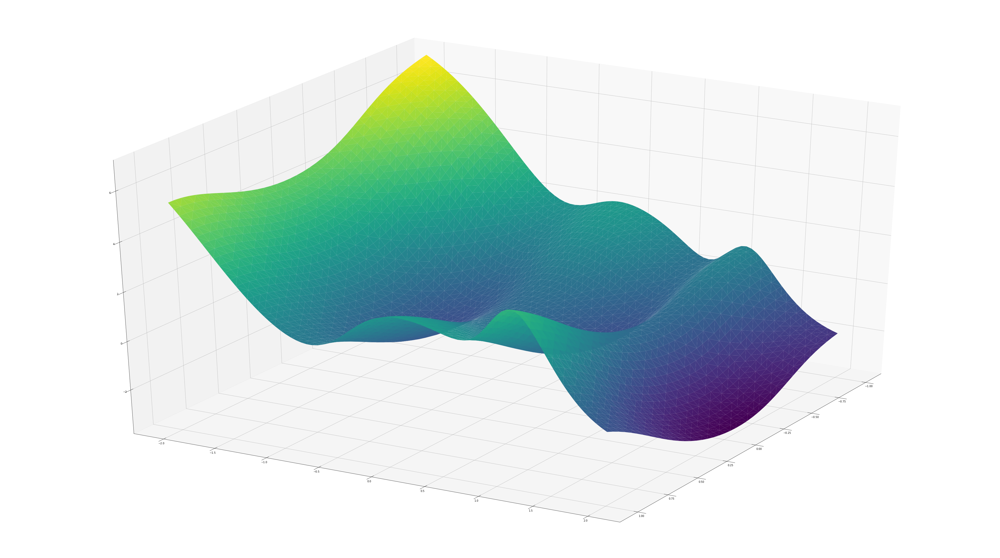

In [38]:
plotting()

# Q1  1.2

In [10]:
def initializeParams_q12(N):
    n=2
    n_y=1
    idxx = list(np.random.choice(X_train.shape[1], N))
    C = X_train[:,idxx].T##np.random.randn(N,n)#X_train[:,idxx].T#
    #print(C.shape)
    
    V = np.random.randn(N,n_y) 
    a=pd.DataFrame(V)
    a[2]=C[:,0]
    a[3]=C[:,1]
    #a[4]=bias
    omega=np.matrix(a)
    
 
   
    return C,V,omega

In [11]:
class RBF(object):
    
    def __init__(self, ro, sigma, N):
        self.ro = ro
        self.sigma = sigma 
        self.N = N

    def set_N(self, x): 
        self.N = x 
    def get_N(self): 
        return self.N     
    
    
    def second_norm(self,omega):
        return np.linalg.norm(omega)**2 

    
    def predict0(self,omega,X):  

        '''
        r=omega.flatten().shape[0]
        try:
            c=omega.flatten().shape[1]

            N=int(omega.shape[1]/4)

        except:
                N=int(omega.shape[0]/4)
                
        '''     
        N=self.N
        omega=omega.flatten().reshape((N,3))
        V = omega[:,0]
        C = omega[:,1:3]
        t1=np.apply_along_axis(np.linalg.norm, 1,X.T - C[0])#X.T - C1
        t = np.exp(-(t1/sigma**2)**2)
        S=t*V[0].item(0)
        for y in range(1,N):
            t1=np.apply_along_axis(np.linalg.norm, 1,X.T - C[y])#X.T - C1
            t = np.exp(-(t1/sigma**2)**2)
            S=S+t*V[y].item(0)
        
        #predicted_values=S
        return S#, W,bias
    def predict2(self,omega,X):  

        N=self.N
        sig = self.sigma
        omega=omega.flatten().reshape((N,3))
        V = omega[:,0]
        #X= X_train
        C1 = omega[:,1].T
        C2 = omega[:,2].T
        X1 = (X[0].T).reshape((X.shape[1],1))
        X2 = (X[1].T).reshape((X.shape[1],1))
        X1 = X1 - C1
        X2 = X2 - C2
        XX = -np.square(np.sqrt(np.square(X1)+np.square(X2))/sig)#(np.linalg.norm(X1,axis=1) + np.linalg.norm(X2,axis=1))
        XX= np.exp(XX)
        CX= XX.dot(V)
        CX= CX.reshape((X.shape[1],))
        
        return CX



    def reg_tr_error(self,omega,functionArgs):
        X=functionArgs[0]
        true=functionArgs[1]
        
        '''
        r=omega.flatten().shape[0]
        
        try:
            c=omega.flatten().shape[1]

            N=int(omega.shape[1]/4)

        except:
                N=int(omega.shape[0]/4)

        '''
        predicted=self.predict2(omega,X)


        err=np.array(predicted)-true #err_all=np.sum(np.array(predicted)-true)**2
        err_all=err.dot(err.T)


        P=X.shape[1]
        return ((err_all)/(2*P)+self.ro*self.second_norm(omega)).item(0)
    

  #  def get_params(self):
  #      return self.ro, self.sigma, self.N
    
  

In [15]:
ro=0.0001
sigma=1
N=2
C,V,omega=initializeParams_q12(N)

rbf=RBF(ro,sigma,N)
cv_data=np.concatenate((data_train,data_validate))
X_train = np.transpose(np.matrix(cv_data)[:,0:2])
Y_train = np.transpose(np.matrix(cv_data)[:,2:])
RR=rbf.predict0(omega.flatten(),X_train)
Rr1= rbf.predict2(omega.flatten(),X_train)
#print(RR)
#print(Rr1)
print(Y_train.shape)
print(mse(Y_train,Rr1))
print(mse(Y_train,RR))

st = time.time()
res=minimize(rbf.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='CG')
omega_star=res['x']
print(time.time()-st)
print(res['fun'])

(1, 255)
3.4219387943791952
3.4219387943791952
0.04690432548522949
0.16184014882341988


just checking

In [352]:
ro=0.00001
sigma=1.111
N=2
rbf=RBF(ro,sigma,N)
C,V,omega=initializeParams_q12(N)
rbf.predict2(omega.flatten(),X_validate).shape

(51, 1)

In [575]:
V = omega[:,0]
X= X_train
#X=np.expand_dims(X, axis=1)
C1 = omega[:,1].T
C2 = omega[:,2].T

X1 = (X[0].T).reshape((X.shape[1],1))
X2 = (X[1].T).reshape((X.shape[1],1))
X1 = X1 - C1
X2 = X2 - C2
XX = -np.square(np.sqrt(np.square(X1)+np.square(X2))/1.2)#(np.linalg.norm(X1,axis=1) + np.linalg.norm(X2,axis=1))
XX= np.exp(XX)#(np.linalg.norm(X1,axis=1) + np.linalg.norm(X2,axis=1))
CX= XX.dot(V)

In [576]:
omega=omega.flatten().reshape((N,3))
V = omega[:,0]
C = omega[:,1:3]
t1=np.apply_along_axis(np.linalg.norm, 1,X.T - C[0])#X.T - C1
t = np.exp(-(t1/1.2)**2)
S=t*V[0].item(0)
for y in range(1,N):
    t1=np.apply_along_axis(np.linalg.norm, 1,X.T - C[y])#X.T - C1
    t = np.exp(-(t1/1.2)**2)
    S=S+t*V[y].item(0)

In [570]:
S.shape

(255,)

In [571]:
CX.shape

(255, 1)

In [542]:
Y_train.shape


(1, 255)

In [577]:
mse(Y_train,CX.flatten())#rbf.predict2(omega_star.flatten(),Xtest))

2.999383628790304

In [578]:
mse(Y_train,S)#rbf.predict2(omega_star.flatten(),Xtest))

2.999383628790304

In [16]:
def fivefoldCV_q12(params):
    '''
    params a list N,rho,sigma
    '''
    global X_train, X_validate, X_test, Y_train, Y_validate, Y_test 

    K=3   # SO 4 folds for training 1-validation for testing; they switch every time
    cv_data=np.concatenate((data_train,data_validate))
    np.random.shuffle(cv_data)
    indices=np.arange(0,255,51)# [  0,  51, 102, 153, 204]
    folds=[]



  #  X=X_train

  #  true=Y_train

    N=params[0]
    rho=params[1]#10**-5 #10-5 unti, 10-3
    sigma=params[2]#1

    C,V,omega=initializeParams_q12(N)

    rbf=RBF(rho,sigma,N)


    P=cv_data.shape[0]

    rbf.set_N(N)
    
    #print(mlp.get_N())

    val_err_mse=[]
    train_err_mse=[]
    fun=[]
    jac_norm=[]
    init=[]

    #train_err={}
    #val_err={}

    data=cv_data.copy()


    res_df=pd.DataFrame(columns=['neurons','rho','sigma','fun','init','err_tr','jac_norm','err_val','err_test'])
    for i in range(len(indices)):
        cv_data=data
        if i<4:
            l=[i for i in range(indices[i],indices[i+1])]
            #(VALIDATION fold) for testing
            validate_cv=cv_data[indices[i]:indices[i+1],:]

            #train folds together for training
            df=pd.DataFrame(cv_data)
            train_cv=df.drop(df.index[l])



            X_train = np.transpose(np.matrix(train_cv)[:,0:2])
            Y_train = np.transpose(np.matrix(train_cv)[:,2:])
            X_validate = np.transpose(validate_cv[:,0:2])
            Y_validate = np.transpose(validate_cv[:,2:])
            init.append(mse(Y_train,rbf.predict2(omega.flatten(),X_train)))

            #print(omega.shape)
        #CHOSEN OMEGA? ->Fitting of the model
            res=minimize(rbf.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='CG')
     #       for i in range(10):
     #           omega=res['x']
     #           res=minimize(mlp.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='L-BFGS-B')
            
            omega=res['x']
            fun.append(res['fun'])
            jac_norm.append(second_norm_jac(res['jac'].T))

        #    err_tr=mse(reg_tr_error(omega.flatten(),[X_train,Y_train]))
            err_tr=mse(Y_train,rbf.predict2(omega.flatten(),X_train))
            err_val=mse(Y_validate,rbf.predict2(omega.flatten(),X_validate))

            train_err_mse.append(err_tr)
            val_err_mse.append(err_val)
            
             
           # train_err_dict[i]=
          #  val_err_dict[i]=mse(Y_validate,predict(omega.flatten(),X_validate))


        else:
            #for the last element
            l=list([i for i in range(indices[i],255)])
            #(VALIDATION fold) for testing
            validate_cv=cv_data[indices[i]:,:]

            #train folds together for training
            df=pd.DataFrame(cv_data)
            train_cv=df.drop(df.index[l])
            init.append(mse(Y_train,rbf.predict2(omega.flatten(),X_train)))

            #CHOSEN OMEGA? ->Fitting of the model
            res=minimize(rbf.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='CG')
          #  for i in range(10):
          #      omega=res['x']
          #      res=minimize(mlp.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='L-BFGS-B')
            
            omega=res['x']
            fun.append(res['fun'])
            jac_norm.append(second_norm_jac(res['jac'].T))


    
            err_tr=mse(Y_train,rbf.predict2(omega.flatten(),X_train))
       #     err_tr=mse(reg_tr_error(omega.flatten(),[X_train,Y_train]))
            err_val=mse(Y_validate,rbf.predict2(omega.flatten(),X_validate))

            train_err_mse.append(err_tr)
            val_err_mse.append(err_val)

      #      train_err_dict_mse[i]=mse(Y_train,predict(omega.flatten(),X_train))
       #     val_err_dict_mse[i]=mse(Y_validate,predict(omega,X_validate))

    err_test=calculate_test_err(cv_data,N,rho,sigma,omega)
    res_df=res_df.append({'neurons':N,'rho':rho,'sigma':sigma,'fun':np.mean(fun),'init':np.mean(init),\
                              'err_tr':np.mean(train_err_mse),'jac_norm':np.mean(jac_norm),\
                              'err_val':np.mean(val_err_mse),'err_test':err_test},ignore_index=True )
    return res_df

In [120]:
def second_norm_jac(omega): 
    return np.linalg.norm(omega)

def mse(true,predicted):
    return (np.sum(np.array(true-predicted)**2))/true.shape[1]


def calculate_test_err(cv_data,neurons,rho,sigma,omega):
    err=[]
    Rbf=RBF(rho,sigma,neurons)
    for i in range(10):
        X_train = np.transpose(np.matrix(cv_data)[:,0:2])
        Y_train = np.transpose(np.matrix(cv_data)[:,2:])
        #train on data train and data validate
        res=minimize(Rbf.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='CG')
        omega=res['x']
        #test on test data
        err.append(mse(Y_test,Rbf.predict2(omega.flatten(),X_test)))
    return np.mean(err)

In [456]:
neurons_count=[2,9,17,25,33]
rho_values=[0.001,0.0001,0.00001]
sigma_vals=[1.11,1.455,1.99]

all_poss_conf=[]
for i in neurons_count:
    for r in rho_values:
        for s in sigma_vals:
            all_poss_conf.append((i,r,s))

def get_data():
    data = df.to_numpy()
    data_train, data_rest = train_test_split(data, test_size=0.30)
    data_test, data_val = train_test_split(data_rest, test_size=0.50)
    data_train, data_validate, data_test = np.split(df.sample(frac=1), [int(.7*len(df)), int(.85*len(df))])
    data_train = data_train.to_numpy()
    data_validate = data_validate.to_numpy()
    data_test = data_test.to_numpy()

    X_tr = np.transpose(data_train[:,0:2])
    Y_tr = np.transpose(data_train[:,2:])
    X_val = np.transpose(data_validate[:,0:2])
    Y_val = np.transpose(data_validate[:,2:])
    X_test = np.transpose(data_test[:,0:2])
    Y_test = np.transpose(data_test[:,2:])
    return X_tr,Y_tr,X_val,Y_val,X_test,Y_test

X, y_true, Xval,Yval, Xtest, Ytest = get_data()
funn,starting_err,ending_err,jac_norm,val_err,test_err=[],[],[],[],[],[]
conf_q2=pd.DataFrame(columns=['neurons','rho','sigma','fun','start_err'\
                                            ,'ending_err','jac_norm',\
                                           'val_err','test_err'])
for conf in tqdm(all_poss_conf):
    C,V,omega=initializeParams_q12(conf[0])

    rbf=RBF(conf[1],conf[2],conf[0])
    res=minimize(rbf.reg_tr_error,omega.flatten(), args=[X,y_true],method='L-BFGS-B')
    omega_star=res['x']
    funn=res['fun']
    #pred_i = rbf.predict(omega.flatten(),X)
    starting_err=mse(y_true,rbf.predict2(omega.flatten(),X))
    ending_err=mse(y_true,rbf.predict2(omega_star.flatten(),X))
    jac_norm=second_norm_jac(res['jac'].T)
    val_err=mse(Yval,rbf.predict(omega_star.flatten(),Xval))
    X=np.concatenate((X.T,Xval.T)).T
    y_true=np.concatenate((y_true.T,Yval.T)).T
    res=minimize(rbf.reg_tr_error,omega_star.flatten(), args=[X,y_true],method='L-BFGS-B')
    omega_star=res['x']
    test_err=mse(Ytest,rbf.predict2(omega_star.flatten(),Xtest))
    conf_q2=conf_q2.append({'neurons':conf[0],'rho':conf[1],'sigma':conf[2],'fun':funn,'start_err':starting_err,\
                              'ending_err':funn,'jac_norm':jac_norm,\
                              'val_err':val_err,'test_err':test_err},ignore_index=True )


conf_q2

In [52]:
fivefoldCV_q12([3,0.0001,1])

,neurons,rho,sigma,fun,init,err_tr,jac_norm,err_val,err_test
0,3.0,0.0001,1.0,0.160633,1.024694,0.320648,0.000015,0.325887,0.394589


In [590]:
from tqdm.notebook import tqdm
res_df=pd.DataFrame()
for conf in tqdm(all_poss_conf):
    res_df=res_df.append(fivefoldCV_q12(conf))

In [591]:
res_df.to_csv('q12_trial1.csv')

In [592]:
res_df

,neurons,rho,sigma,fun,init,err_tr,jac_norm,err_val,err_test
0,2.0,0.00100,1.110,0.177755,0.801895,0.349298,0.000004,0.414164,0.250957
0,2.0,0.00100,1.455,0.194097,0.728759,0.378325,0.000010,0.389923,0.337060
0,2.0,0.00100,1.990,0.228516,1.597789,0.427561,0.000010,0.463006,0.423608
0,2.0,0.00010,1.110,0.182327,1.833640,0.358485,0.000013,0.383597,0.250954
0,2.0,0.00010,1.455,0.191874,1.494236,0.373898,0.000008,0.420180,0.337067
0,2.0,0.00010,1.990,0.230880,0.838464,0.432321,0.000006,0.438599,0.423633
0,2.0,0.00001,1.110,0.711747,1.729702,1.417242,0.000010,1.477483,1.352725
0,2.0,0.00001,1.455,0.191158,0.727729,0.372153,0.000014,0.418013,0.337047
0,2.0,0.00001,1.990,0.227561,0.827975,0.425202,0.000011,0.465400,0.423636
0,9.0,0.00100,1.110,0.092606,1.198719,0.152067,0.000020,0.240307,0.120779


In [13]:
neurons_count=[50,88,125]
rho_values=[0.001,0.0001,0.00001]
sigma_vals=[1.11,1.455,1.99]

all_poss_conf=[]
for i in neurons_count:
    for r in rho_values:
        for s in sigma_vals:
            all_poss_conf.append((i,r,s))

In [16]:
from tqdm.notebook import tqdm
res_df=pd.DataFrame()
for conf in tqdm(all_poss_conf):
    res_df=res_df.append(fivefoldCV_q12(conf))

KeyboardInterrupt: 

In [ ]:
res_df.to_csv('q12_trial1_bigvals.csv')

# Q2 Extreme Learning 2.1

In [18]:
class MLP_Q2(object):
    
    def __init__(self, ro, sigma, N):
        self.ro = ro
        self.sigma = sigma 
        self.N = N

    def set_N(self, x): 
        self.N = x 
    def get_N(self): 
        return self.N     
    
    
    def second_norm(self,omega):
        return np.linalg.norm(omega)**2 

    def activation_f(self,t,sigma=1):
        return (np.exp(2*sigma*t)-1)/(np.exp(2*sigma*t)+1)

    def predict(self,X, W, bias, V):  
  
        N=self.N
        t=W.dot(X)-bias
        #print(t.shape)
        predicted_values=V.dot(self.activation_f(t,sigma))
        return predicted_values#, W,bias




    def reg_tr_error(self,V,functionArgs):
        X=functionArgs[0]
        true=functionArgs[1]
        W = functionArgs[2]
        bias = functionArgs[3]
        
        predicted=self.predict(X,W,bias,V)


        err=np.array(predicted)-true #err_all=np.sum(np.array(predicted)-true)**2
        err_all=err.dot(err.T)


        P=X.shape[1]
        #omega_upd=np.append(np.append(V,W, axis=1), bias, axis=1)
        a=pd.DataFrame(V.T)
        a[2]=W[:,0]
        a[3]=W[:,1]
        a[4]=bias
        omega_upd=np.matrix(a)
        return ((err_all)/(2*P)+self.ro*self.second_norm(omega_upd)).item(0)
    

  #  def get_params(self):
  #      return self.ro, self.sigma, self.N
    
  

In [8]:
def initializeParams_q2(N):
    n=2
    n_y=1
    W = np.random.randn(N,n)*np.random.randn(N,n)*np.random.randn(N,n)
    bias = np.random.randn(N,1)*np.random.randn(N,1)*np.random.randn(N,1)
    V = np.random.randn(n_y,N) 
    a=pd.DataFrame(V.T)
    a[2]=W[:,0]
    a[3]=W[:,1]
    a[4]=bias
    omega=np.matrix(a)
    
 
   
    return W,bias,V,omega

In [22]:
from scipy import optimize
ro=0.00001#all_poss_conf[-2][1]
sigma=1#all_poss_conf[-2][2]
N=13#all_poss_conf[-2][0]
W,bias,V,omega=initializeParams_q2(N)

mlp_q2=MLP_Q2(ro,sigma,N)
cv_data=np.concatenate((data_train,data_validate))
X_train = np.transpose(np.matrix(cv_data)[:,0:2])
Y_train = np.transpose(np.matrix(cv_data)[:,2:])


In [17]:
res=minimize(mlp_q2.reg_tr_error,V, args=[X_train,Y_train, W, bias],method='CG')


In [18]:
V_star=res['x']

In [19]:
res

     fun: 0.7748942129855373
     jac: array([-1.50501728e-06, -4.11272049e-06])
 message: 'Optimization terminated successfully.'
    nfev: 60
     nit: 10
    njev: 15
  status: 0
 success: True
       x: array([-1.45387099,  0.39245743])

In [20]:
print(mlp_q2.reg_tr_error(V_star,[X_train,Y_train,W,bias]))

0.7748942129855373


In [21]:
print(mlp_q2.reg_tr_error(V_star,[X_test,Y_test,W,bias]))

0.42605318663561215


In [23]:
def q_2_mlp(rho,sigma,N,rep, X,Y,X_test,Y_test):
    test_err=[]
    train_err=[]
    from tqdm import tqdm
    for r in tqdm(range(rep)):
        W,bias,V,omega=initializeParams_q2(N)
        mlp=MLP_Q2(rho,sigma,N)
        res=minimize(mlp.reg_tr_error,V, args=[X,Y, W, bias],method='CG')
        V_star=res['x']
        curr_err=mlp.reg_tr_error(V_star,[X_test,Y_test,W,bias])
        test_err.append(curr_err)
        train_err.append(mlp.reg_tr_error(V_star,[X,Y,W,bias]))
        if np.min(test_err)==curr_err:
            best = (W,bias,V_star)
    return best,test_err,train_err

In [24]:
best_V_W_b,test_errs,train_errs=q_2_mlp(ro,sigma,N,10, X_train,Y_train,X_test,Y_test)

100%|██████████| 10/10 [05:02<00:00, 30.26s/it]


In [25]:
test_errs

[0.13010407241356184,
 0.19359023406108655,
 0.19135094237401568,
 0.18402610994800284,
 0.1107552328870741,
 0.21813944181318362,
 0.18617409752927047,
 0.14244003539662564,
 0.15662692396955538,
 0.1491054903857599]

In [26]:
train_errs

[0.1360953724723772,
 0.2908494108831902,
 0.2570995370222791,
 0.24653191945042321,
 0.09750420286043955,
 0.29905187581199494,
 0.21630391076363542,
 0.17630905221542847,
 0.1730937817076409,
 0.26229254368909266]

In [27]:
WW=best_V_W_b[0]
res_q2=pd.DataFrame(WW[:,0])
res_q2[2]=WW[:,1]
res_q2[3]=best_V_W_b[1]
res_q2[4]=best_V_W_b[2]
res_q2.to_csv('res_q2_W_b_V.csv')


In [28]:
res_q2=pd.read_csv('res_q2_W_b_V.csv',usecols=[1,2,3,4])
omega_upd=res_q2

In [29]:
omega_upd.values

array([[ 5.01350701e-02, -6.62105005e-02,  7.85067432e-03,
         9.00335585e-01],
       [-5.83327780e-01,  2.41402448e-01, -3.08233125e-01,
         1.14097479e+01],
       [-6.89766848e-02,  1.43182842e-01, -2.02375213e-01,
         1.94442997e+00],
       [-1.59130372e-01, -2.78933752e-01, -4.83339508e-01,
        -1.08144131e+01],
       [-4.21043593e-01, -3.91663544e-01,  9.86182272e-01,
         4.57470217e+00],
       [-2.28559877e-02, -1.07703120e-01,  2.65955865e-02,
         1.35231105e+00],
       [ 6.35284102e-01,  2.88880477e-01, -2.67361409e-01,
        -7.23669611e-01],
       [-8.88381600e-03,  1.75003438e-04, -1.37328693e+00,
         6.86069318e+00],
       [ 1.30802708e+00, -1.15776615e-01, -6.35138829e-01,
        -5.98744418e+00],
       [-1.28566583e-02, -1.00156343e+00, -6.56553309e-01,
         3.55810930e+00],
       [-6.91839738e-01,  9.47760887e-02, -5.68282569e-03,
        -1.68023643e+01],
       [ 1.49459141e-02,  2.66463882e-01,  7.60062298e-02,
      

In [30]:
best_V_W_b

(array([[ 5.01350701e-02, -6.62105005e-02],
        [-5.83327780e-01,  2.41402448e-01],
        [-6.89766848e-02,  1.43182842e-01],
        [-1.59130372e-01, -2.78933752e-01],
        [-4.21043593e-01, -3.91663544e-01],
        [-2.28559877e-02, -1.07703120e-01],
        [ 6.35284102e-01,  2.88880477e-01],
        [-8.88381600e-03,  1.75003438e-04],
        [ 1.30802708e+00, -1.15776615e-01],
        [-1.28566583e-02, -1.00156343e+00],
        [-6.91839738e-01,  9.47760887e-02],
        [ 1.49459141e-02,  2.66463882e-01],
        [-1.67312304e+00,  2.36174001e+00]]), array([[ 0.00785067],
        [-0.30823313],
        [-0.20237521],
        [-0.48333951],
        [ 0.98618227],
        [ 0.02659559],
        [-0.26736141],
        [-1.37328693],
        [-0.63513883],
        [-0.65655331],
        [-0.00568283],
        [ 0.07600623],
        [-0.55501829]]), array([  0.90033558,  11.40974794,   1.94442997, -10.81441305,
          4.57470217,   1.35231105,  -0.72366961,   6.86069318,

In [31]:
mlp_q2=MLP_Q2(ro,sigma,N)
print(mlp_q2.reg_tr_error(best_V_W_b[2],[X_test,Y_test,best_V_W_b[0],best_V_W_b[1]]))

0.1107552328870741


In [35]:
def plotting_q2(W_inp,bias_inp,V_inp): 
 ##   rho=all_poss_conf[-2][1]
 ##   sigma=all_poss_conf[-2][2]
 ##   mlp=MLP(rho,sigma)
    
    fig = plt.figure(figsize=(70,40))
    ax = plt.axes(projection='3d')
   
  #  cv_data=np.concatenate((data_train,data_validate))
  #  X_train = np.transpose(np.matrix(cv_data)[:,0:2])
  #  Y_train = np.transpose(np.matrix(cv_data)[:,2:])
    
##    X_train = np.transpose(np.matrix(data)[:,0:2])
##    Y_train = np.transpose(np.matrix(data)[:,2:])
##
##    res=minimize(mlp.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='L-BFGS-B')
  #  for i in range(5):
  #      omega2=res['x']
  #      res=minimize(mlp.reg_tr_error,omega2.flatten(), args=[X_train,Y_train],method='L-BFGS-B')
            
    #omega2=omega_star
    a=pd.DataFrame(V_inp.T)
    a[2]=W_inp[:,0]
    a[3]=W_inp[:,1]
    a[4]=bias_inp
    omega2=np.matrix(a)
    
 #   xy = np.mgrid[-2:2.002:0.05, -1:1.002:0.05].reshape(2,-1).T
    xy = np.mgrid[-1:1.002:0.05, -2:2.002:0.05].reshape(2,-1).T

    X = xy[:, 0].squeeze()
    Y = xy[:, 1].squeeze()
    
    XY=np.concatenate((X,Y)).reshape(2,X.shape[0]).T
    #print(XY)

    
    Z = mlp_q2.predict(XY.T,W_inp,bias_inp,V_inp)
    Z = Z.T.reshape(X.shape[0],)

    ax = fig.gca(projection='3d')
    ax.view_init(azim=30)
   # ax.set_zlim(-2,6)
    surf = ax.plot_trisurf(X, Y, Z, linewidth=0.010, antialiased=True,cmap='viridis')
    fig.savefig('11_MLP')
    plt.grid()
  #  return X.shape,Y.shape,Z.shape,X,Y,Z.T
 
    
   

    plt.show()

In [36]:
uu=omega_upd.values[:,0:2]
bb=omega_upd.values[:,2].reshape(N,1)
vv=omega_upd.values[:,3].reshape(N,1).T
mlp_q2=MLP_Q2(ro,sigma,N)
print(mlp_q2.reg_tr_error(vv,[X_test,Y_test,np.array(uu),bb]))

0.11075523288707403


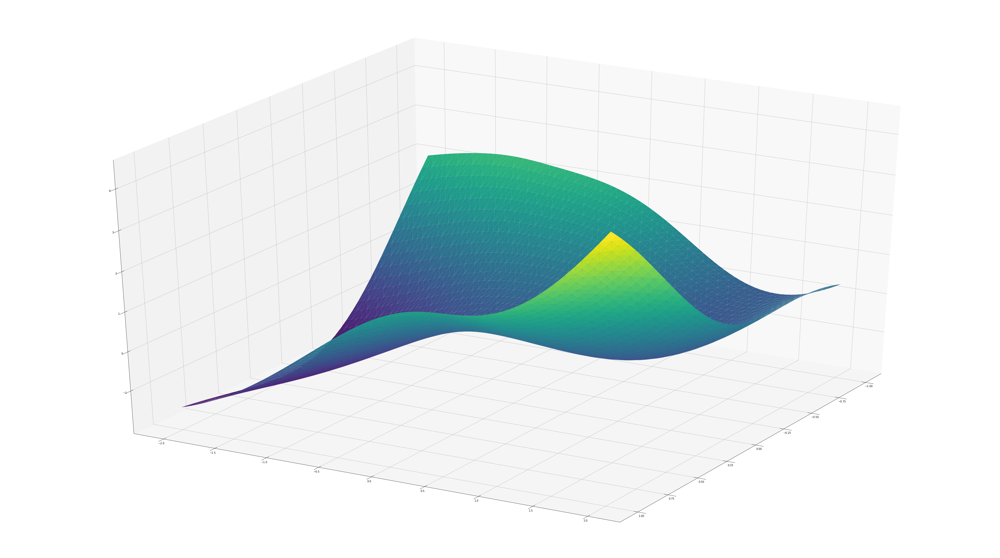

In [37]:
plotting_q2(np.array(uu),bb,vv)# with 13 neurons

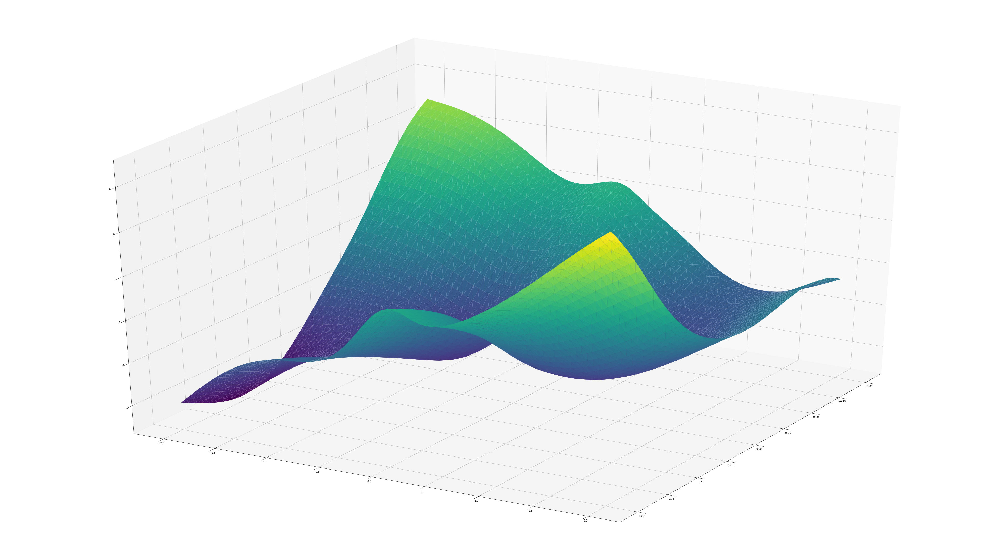

In [78]:
plotting_q2(np.array(uu),bb,vv)# with 25 neurons

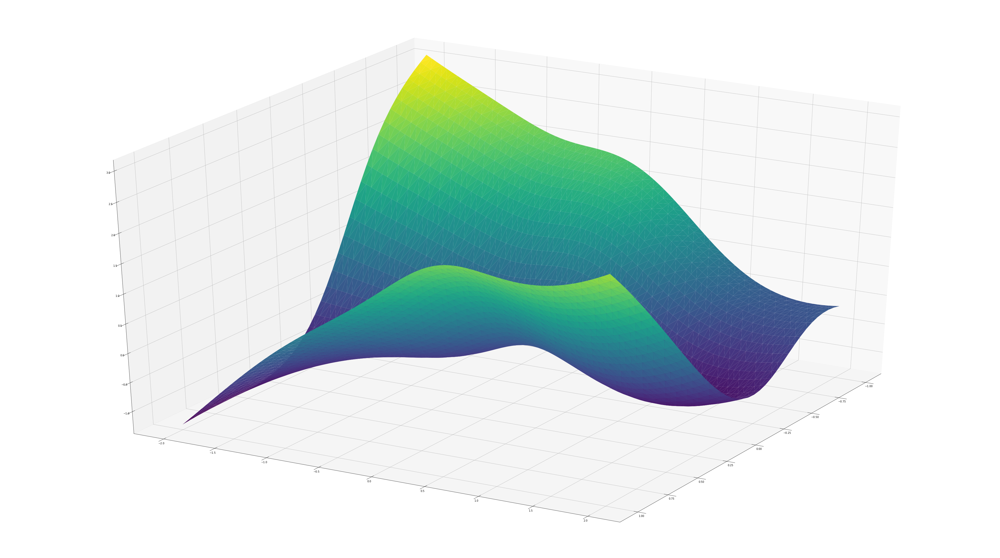

In [48]:
plotting_q2(np.array(uu),bb,vv)# with 20 neurons

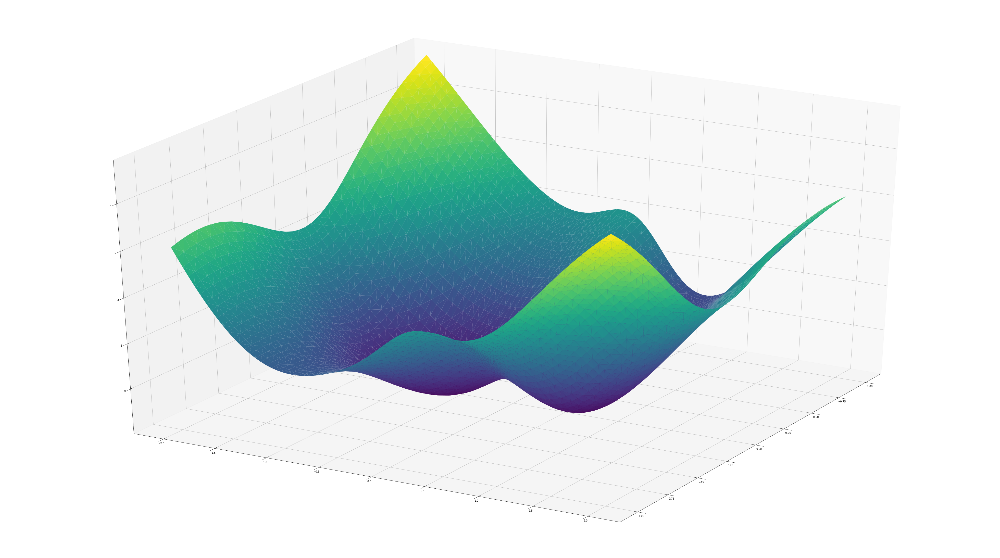

In [89]:
plotting_q2(np.array(uu),bb,vv)# with 33 neurons

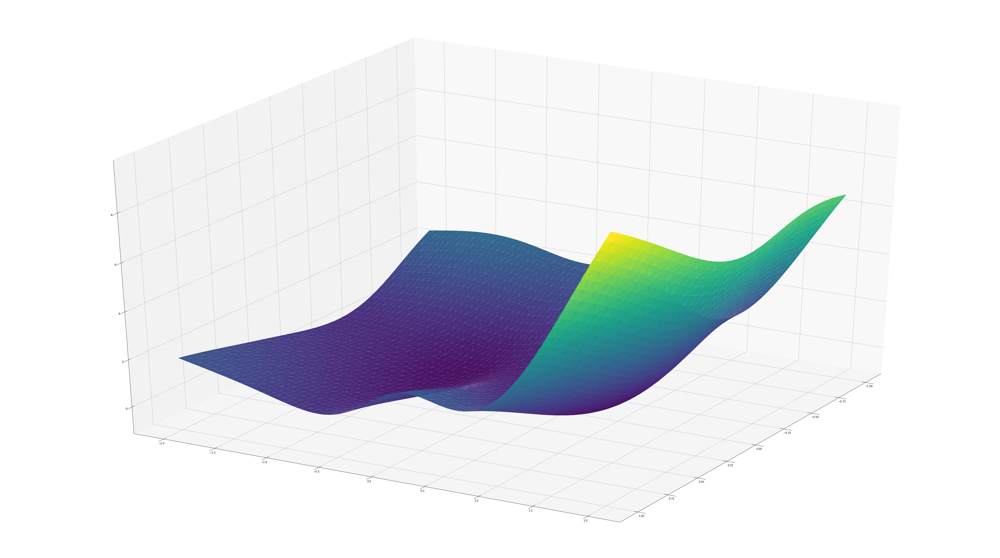

In [77]:
plotting_q2(np.array(uu),bb,vv)# with 23 neurons

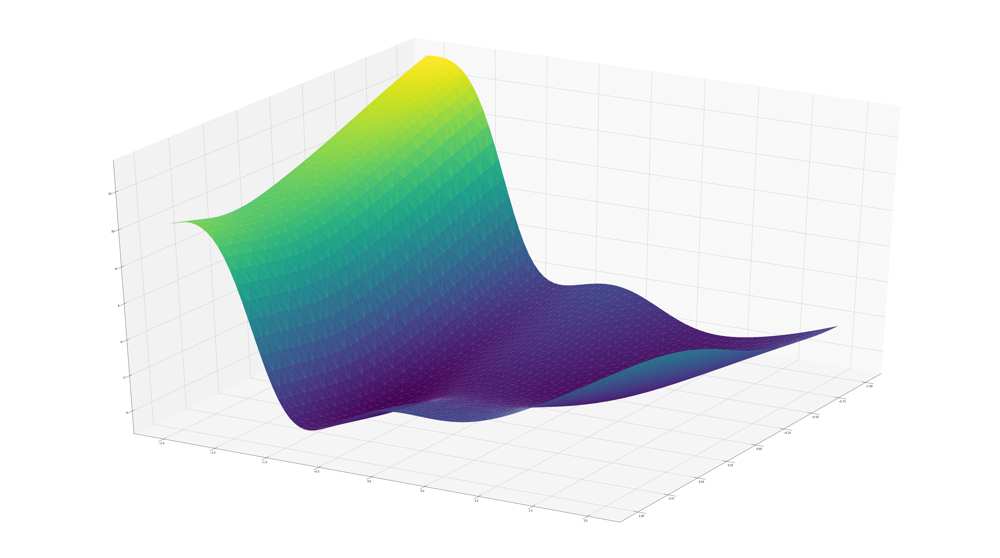

In [60]:
plotting_q2(best_V_W_b[0],best_V_W_b[1],best_V_W_b[2]) # with 17 neurons

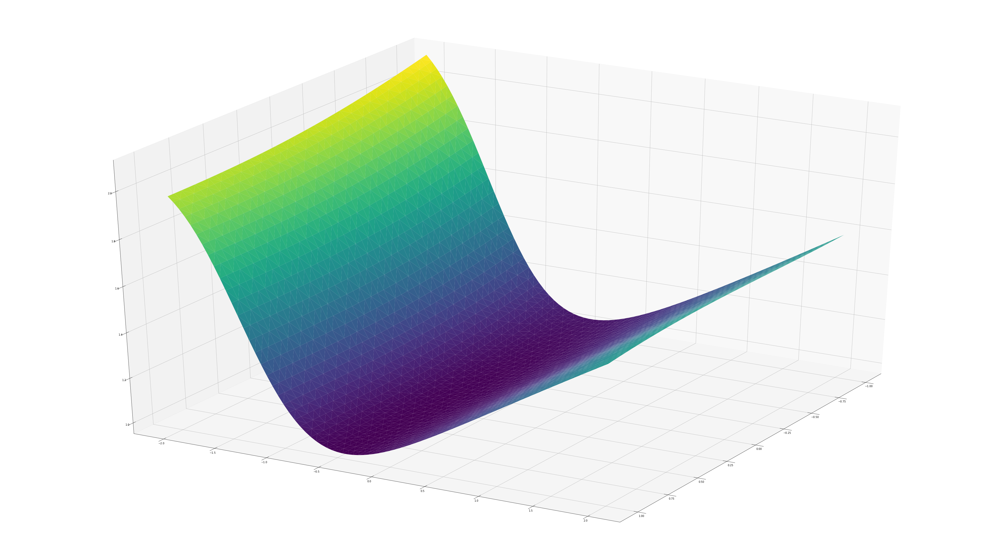

In [50]:
plotting_q2(best_V_W_b[0],best_V_W_b[1],best_V_W_b[2]) # with 3 neurons

### Q2 Unsupervised selection of centers 2.2

In [27]:
## Choose centers

In [14]:
import itertools
from sklearn.cluster import KMeans

In [375]:
class RBF_Q2(object):
    
    def __init__(self, ro, sigma, N):
        self.ro = ro
        self.sigma = sigma 
        self.N = N

    def set_N(self, x): 
        self.N = x 
    def get_N(self): 
        return self.N     
    
    
    def second_norm(self,omega):
        return np.linalg.norm(omega)**2 

    
    def predict0(self,omega,X):  

        '''
        r=omega.flatten().shape[0]
        try:
            c=omega.flatten().shape[1]

            N=int(omega.shape[1]/4)

        except:
                N=int(omega.shape[0]/4)
                
        '''     
        N=self.N
        omega=omega.flatten().reshape((N,3))
        V = omega[:,0]
        C = omega[:,1:3]
        t1=np.apply_along_axis(np.linalg.norm, 1,X.T - C[0])#X.T - C1
        t = np.exp(-(t1/sigma**2)**2)
        S=t*V[0].item(0)
        for y in range(1,N):
            t1=np.apply_along_axis(np.linalg.norm, 1,X.T - C[y])#X.T - C1
            t = np.exp(-(t1/sigma**2)**2)
            S=S+t*V[y].item(0)
        
        #predicted_values=S
        return S#, W,bias
    def predict2(self,omega,X):  

        N=self.N
        sig = self.sigma
        omega=omega.flatten().reshape((N,3))
        V = omega[:,0]
        #X= X_train
        C1 = omega[:,1].T
        C2 = omega[:,2].T
        X1 = (X[0].T).reshape((X.shape[1],1))
        X2 = (X[1].T).reshape((X.shape[1],1))
        X1 = X1 - C1
        X2 = X2 - C2
        XX = -np.square(np.sqrt(np.square(X1)+np.square(X2))/sig)#(np.linalg.norm(X1,axis=1) + np.linalg.norm(X2,axis=1))
        XX= np.exp(XX)
        CX= XX.dot(V)
        CX= CX.reshape((X.shape[1],))
        
        return CX

    def predict22(self,V,C,X):  

        N=self.N
        sig = self.sigma
        V=V.flatten().reshape((N,1))
        #X= X_train
        C1 = C[:,0].T
        C2 = C[:,1].T
        X1 = (X[0].T).reshape((X.shape[1],1))
        X2 = (X[1].T).reshape((X.shape[1],1))
        X1 = X1 - C1
        X2 = X2 - C2
        XX = -np.square(np.sqrt(np.square(X1)+np.square(X2))/sig)#(np.linalg.norm(X1,axis=1) + np.linalg.norm(X2,axis=1))
        XX= np.exp(XX)
        CX= XX.dot(V)
        CX= CX.reshape((X.shape[1],))
        
        return CX


    def reg_tr_error(self,V,functionArgs):
        X=functionArgs[0]
        true=functionArgs[1]
        C=functionArgs[2]
        V = V.flatten().reshape((self.N,1))
        
        '''
        r=omega.flatten().shape[0]
        
        try:
            c=omega.flatten().shape[1]

            N=int(omega.shape[1]/4)

        except:
                N=int(omega.shape[0]/4)

        '''
        predicted=self.predict22(V,C,X)


        err=np.array(predicted)-true #err_all=np.sum(np.array(predicted)-true)**2
        err_all=err.dot(err.T)


        P=X.shape[1]
        return ((err_all)/(2*P)+self.ro*self.second_norm(omega)).item(0)
    

  #  def get_params(self):
  #      return self.ro, self.sigma, self.N
    
  

In [337]:
ini = 10 #number of repetitions to reduce the beginnings with "bad points"
N = 33
rho = 0.00001
sigma = 1.11

In [11]:
def choose_centers(X,N,ini=2):
    for _ in range(ini):
    # define the random initial parameters
        v_init = [random.uniform(0, 1) for i in range(N)]
        
        kmeans=KMeans(n_clusters=N, random_state=_)
        a=kmeans.fit(X.T)
        c_init=a.cluster_centers_
    return c_init

In [12]:
def initializeParams_q22(N,X):
    n_y=1
    V = np.random.randn(N,n_y) # Maybe we should choose some small values (0,1)????
    C = choose_centers(X,N,10)
    
    a=pd.DataFrame(V)
    a[2]=C[:,0]
    a[3]=C[:,1]
    omega=np.matrix(a)
    
    return V,C,omega

In [281]:
V,C,omega = initializeParams_q22(N,X_train)

Gradient of the regularized error:
$$\nabla_{v} E(v,c)=\frac{1}{P}\Phi ^{T}(\Phi v \;- \;Y)\;+\;2 \rho v$$

In [437]:
def grad_reg_error(V, args):
    try:
        X = args[0]
        Y = args[1]
        C0 = args[2]
        N = args[3]
        rho = args[4]
        sigma = args[5]
    
    
        V=V.flatten().reshape((N,1))

        #V = omega[:,0]
        #C1 = omega[:,1].T
        #C2 = omega[:,2].T
        C1 = C0[:,0].T
        C2 = C0[:,1].T
   
        X1 = (X[0].T).reshape((X.shape[1],1))
        X2 = (X[1].T).reshape((X.shape[1],1))
  
        X1 = X1 - C1
        X2 = X2 - C2

        XX = -np.square(np.sqrt(np.square(X1)+np.square(X2))/sigma)

        

        Phi= np.exp(XX)
#     

        #        grad = (1/X.shape[1])*((Phi.T).dot((Phi.dot(V))-Y.T))+2*rho*V
        grad1=((1/X.shape[1])*(((Phi.T).dot((Phi.dot(V))-Y.T))))#.flatten()
  ##      print('ds',grad1.shape)
        gg=(2*rho*V)#.reshape((X.shape[1],1))
##        print('1',grad1.flatten()[0],'shape',grad1.shape)
##        print('2',gg.shape)
        grad=np.sum([grad1,gg],axis=0)#.flatten()
   #     grad = (1/X.shape[1])*((Phi.T).dot((Phi.dot(V))-Y.T))+2*rho*V
    except:
        print('mjau')
    return grad.flatten()

In [385]:
def second_norm_jac(omega): 
    return np.linalg.norm(omega)

def mse(true,predicted):
    return (np.sum(np.array(true-predicted)**2))/true.shape[1]


def calculate_test_err(cv_data,C,neurons,rho,sigma,V):
    err=[]
    Rbf=RBF_Q2(rho,sigma,neurons)
    for i in range(10):
        X_train = np.transpose(np.matrix(cv_data)[:,0:2])
        Y_train = np.transpose(np.matrix(cv_data)[:,2:])
        #train on data train and data validate
        res=minimize(Rbf.reg_tr_error,V.flatten(), args=[X_train,Y_train,C,N,rho,sigma],method='CG',jac=grad_reg_error)
        V=res['x']
        #test on test data
        err.append(mse(Y_test,Rbf.predict22(V.flatten(),C,X_test)))
    return np.mean(err)

In [342]:
def fivefoldCV_q22(params):
    '''
    params a list N,rho,sigma
    '''
    global X_train, X_validate, X_test, Y_train, Y_validate, Y_test 

    K=5   # SO 4 folds for training 1-validation for testing; they switch every time
    cv_data=np.concatenate((data_train,data_validate))
    np.random.shuffle(cv_data)
    indices=np.arange(0,255,51)# [  0,  51, 102, 153, 204]
    folds=[]



  #  X=X_train

  #  true=Y_train

    N=params[0]
    rho=params[1]#10**-5 #10-5 unti, 10-3
    sigma=params[2]#1

    V,C0,omega = initializeParams_q22(N,X_train)

    rbf=RBF_Q2(rho,sigma,N)


    P=cv_data.shape[0]

    rbf.set_N(N)
    
    #print(mlp.get_N())

    val_err_mse=[]
    train_err_mse=[]
    fun=[]
    jac_norm=[]
    init=[]

    #train_err={}
    #val_err={}

    data=cv_data.copy()


    res_df=pd.DataFrame(columns=['neurons','rho','sigma','fun','init','err_tr','jac_norm','err_val','err_test'])
    for i in range(len(indices)):
        cv_data=data
        if i<4:
            l=[i for i in range(indices[i],indices[i+1])]
            #(VALIDATION fold) for testing
            validate_cv=cv_data[indices[i]:indices[i+1],:]

            #train folds together for training
            df=pd.DataFrame(cv_data)
            train_cv=df.drop(df.index[l])



            X_train = np.transpose(np.matrix(train_cv)[:,0:2])
            Y_train = np.transpose(np.matrix(train_cv)[:,2:])
            X_validate = np.transpose(validate_cv[:,0:2])
            Y_validate = np.transpose(validate_cv[:,2:])
            init.append(mse(Y_train,rbf.predict22(V,C,X_train)))

            #print(omega.shape)
        #CHOSEN OMEGA? ->Fitting of the model
            res=minimize(rbf.reg_tr_error,V, args=[X_train,Y_train,C,N,rho,sigma],method='CG',jac=grad_reg_error)
     #       for i in range(10):
     #           omega=res['x']
     #           res=minimize(mlp.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='L-BFGS-B')
            
            V=res['x']
            fun.append(res['fun'])
            jac_norm.append(second_norm_jac(res['jac'].T))

        #    err_tr=mse(reg_tr_error(omega.flatten(),[X_train,Y_train]))
            err_tr=mse(Y_train,rbf.predict22(V,C,X_train))
            err_val=mse(Y_validate,rbf.predict22(V,C,X_validate))

            train_err_mse.append(err_tr)
            val_err_mse.append(err_val)
            
             
           # train_err_dict[i]=
          #  val_err_dict[i]=mse(Y_validate,predict(omega.flatten(),X_validate))


        else:
            #for the last element
            l=list([i for i in range(indices[i],255)])
            #(VALIDATION fold) for testing
            validate_cv=cv_data[indices[i]:,:]

            #train folds together for training
            df=pd.DataFrame(cv_data)
            train_cv=df.drop(df.index[l])
            init.append(mse(Y_train,rbf.predict22(V,C,X_train)))

            #CHOSEN OMEGA? ->Fitting of the model
            res=minimize(rbf.reg_tr_error,V, args=[X_train,Y_train,C,N,rho,sigma],method='CG',jac=grad_reg_error)
          #  for i in range(10):
          #      omega=res['x']
          #      res=minimize(mlp.reg_tr_error,omega.flatten(), args=[X_train,Y_train],method='L-BFGS-B')
            
            V=res['x']
            fun.append(res['fun'])
            jac_norm.append(second_norm_jac(res['jac'].T))


    
            err_tr=mse(Y_train,rbf.predict22(V,C,X_train))
       #     err_tr=mse(reg_tr_error(omega.flatten(),[X_train,Y_train]))
            err_val=mse(Y_validate,rbf.predict22(V,C,X_validate))

            train_err_mse.append(err_tr)
            val_err_mse.append(err_val)

      #      train_err_dict_mse[i]=mse(Y_train,predict(omega.flatten(),X_train))
       #     val_err_dict_mse[i]=mse(Y_validate,predict(omega,X_validate))

    err_test=calculate_test_err(cv_data,N,rho,sigma,omega)
    res_df=res_df.append({'neurons':N,'rho':rho,'sigma':sigma,'fun':np.mean(fun),'init':np.mean(init),\
                              'err_tr':np.mean(train_err_mse),'jac_norm':np.mean(jac_norm),\
                              'err_val':np.mean(val_err_mse),'err_test':err_test},ignore_index=True )
    return res_df

In [390]:
N

33

In [ ]:
## Trying to do optimization

In [343]:
pars =[N,rho,sigma]
V,C,omega = initializeParams_q22(N,X_train)
args=[X_train,Y_train,C,N,rho,sigma]
rbf = RBF_Q2(N,rho,sigma)

In [344]:
X = args[0]
Y = args[1]
C0 = args[2]
N = args[3]
rho = args[4]
sigma = args[5]

In [386]:
a = rbf.reg_tr_error(V.flatten(),args)

In [387]:
a # starting value of the error

3116.0920453837907

In [388]:
res=minimize(rbf.reg_tr_error,V.flatten(), args=[X_train,Y_train,C,N,rho,sigma],method='CG')#,jac=grad_reg_error)

In [389]:
res

      fun: 3116.0920453837907
 hess_inv: array([[1, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 1]])
      jac: array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
  message: 'Optimization terminated successfully.'
     nfev: 35
      nit: 0
     njev: 1
   status: 0
  success: True
        x: array([ 2.21271099, -1.09983161,  0.9797938 ,  0.84578377, -1.08701122,
        0.3510502 ,  1.78375072,  1.21931257, -0.74086391,  0.01813061,
        0.34129664,  1.36103156,  2.18103958,  0.09349872,  0.54055488,
       -0.86873625, -0.46557847, -1.18711644,  0.09600767, -0.66109893,
        1.77338941, -0.61080729,  0.78031816,  0.60848625, -0.63261095,
       -1.2412164 ,  0.27267051,  0.87394672, -0.78033153, -0.28052034,
        0.44119652,  1.00555182, 

In [217]:
params = [N,rho,sigma]
res = fivefoldCV_q22(params)

ValueError: operands could not be broadcast together with shapes (33,255) (33,) 

# 3 trial

In [439]:
def second_norm_jac(omega): 
    return np.linalg.norm(omega)

In [485]:
def grad_reg_error_V(V, args):
    try:
        X = args[0]
        Y = args[1]
        C0 = args[2]
        N = args[3]
        rho = args[4]
        sigma = args[5]
    
    
        V=V.flatten().reshape((N,1))

        #V = omega[:,0]
        #C1 = omega[:,1].T
        #C2 = omega[:,2].T
        C1 = C0[:,0].T
        C2 = C0[:,1].T
   
        X1 = (X[0].T).reshape((X.shape[1],1))
        X2 = (X[1].T).reshape((X.shape[1],1))
  
        X1 = X1 - C1
        X2 = X2 - C2

        XX = -np.square(np.sqrt(np.square(X1)+np.square(X2))/sigma)

        

        Phi= np.exp(XX)
#     

        #        grad = (1/X.shape[1])*((Phi.T).dot((Phi.dot(V))-Y.T))+2*rho*V
        grad1=((1/X.shape[1])*(((Phi.T).dot((Phi.dot(V))-Y.T))))#.flatten()
  ##      print('ds',grad1.shape)
        gg=(2*rho*V)#.reshape((X.shape[1],1))
##        print('1',grad1.flatten()[0],'shape',grad1.shape)
##        print('2',gg.shape)
        grad=np.sum([grad1,gg],axis=0)#.flatten()
   #     grad = (1/X.shape[1])*((Phi.T).dot((Phi.dot(V))-Y.T))+2*rho*V
    except:
        grad=V
    return grad.flatten()

In [486]:
def grad_reg_error_C(C0, args):
    
    X = args[0]
    Y = args[1]
    V = args[2]
    N = args[3]
    rho = args[4]
    sigma = args[5]
    
    C=C0.flatten().reshape((N,2))
    V=V.flatten().reshape((N,1))
    
    C1 = C[:,0].T
    C2 = C[:,1].T
    X1 = (X[0].T).reshape((X.shape[1],1))
    X2 = (X[1].T).reshape((X.shape[1],1))
    X1 = X1 - C1
    #print(X1.shape)
    X2 = X2 - C2
    XX = -np.square(np.sqrt(np.square(X1)+np.square(X2))/sigma)
    
    # derivative part
    Phi= np.exp(XX) * 2/np.square(sigma)
    #print("exp")
    #print(Phi.shape)
    Phi1 = Phi*X1
    Phi2 = Phi*X2
    #print(Phi1.shape)
    #print(Phi1)
    
    #part where sum by neurons
    
    Phi_N = (np.exp(XX)).dot(V) - Y.T
    
    Phi_final_1 =  V.T *(Phi_N * Phi1).sum(axis=0) + rho*C1
    Phi_final_2 =  V.T *(Phi_N*Phi2).sum(axis=0) + rho*C2

    Final = np.zeros((N,2))
    Final[:,0]=Phi_final_1
    Final[:,1]=Phi_final_2
    Final = Final
    #print(Phi1.T )
    #print(Phi2.T)
    #grad = (1/X.shape[1])*((Phi.T).dot((Phi.dot(V))-Y.T))+2*rho*V
    
    return Final.flatten()/X.shape[1]

In [477]:
ini = 10 #number of repetitions to reduce the beginnings with "bad points"
N = 3
rho = 0.00001
sigma = 1.11
pars =[N,rho,sigma]
V,C,omega = initializeParams_q22(N,X_train)
args=[X_train,Y_train,V,N,rho,sigma]
rbf1= RBF_Q3(rho,sigma,N)

In [444]:
class RBF_Q3(object):
    
    def __init__(self, ro, sigma, N):
        self.ro = ro
        self.sigma = sigma 
        self.N = N

    def set_N(self, x): 
        self.N = x 
    def get_N(self): 
        return self.N     
    
    
    def second_norm(self,omega):
        return np.linalg.norm(omega)**2 

    def predict22(self,V,C,X):  

        N=self.N
        sig = self.sigma
        #C=C.reshape((N,2))
        
        V=V.flatten().reshape((self.N,1))
        C=C.flatten().reshape((self.N,2))
        #X= X_train
        C1 = C[:,0].T
        C2 = C[:,1].T
        X1 = (X[0].T).reshape((X.shape[1],1))
        X2 = (X[1].T).reshape((X.shape[1],1))
        X1 = X1 - C1
        X2 = X2 - C2
        XX = -np.square(np.sqrt(np.square(X1)+np.square(X2))/sig)#(np.linalg.norm(X1,axis=1) + np.linalg.norm(X2,axis=1))
        XX= np.exp(XX)
        CX= XX.dot(V)
        CX= CX.reshape((X.shape[1],))
        
        return CX


    def reg_tr_error_C(self,C,functionArgs):
        X=functionArgs[0]
        true=functionArgs[1]
        V=functionArgs[2]
        V = V.flatten().reshape((self.N,1))
        #C=C.flatten().reshape((self.N,2))
        #print(C)
        
        predicted=self.predict22(V,C,X)


        err=np.array(predicted)-true #err_all=np.sum(np.array(predicted)-true)**2
        err_all=err.dot(err.T)


        P=X.shape[1]
        return ((err_all)/(2*P)+self.ro*self.second_norm(omega)).item(0)
    def reg_tr_error_V(self,V,functionArgs):
        X=functionArgs[0]
        true=functionArgs[1]
        C=functionArgs[2]
        V = V.flatten().reshape((self.N,1))
        
        predicted=self.predict22(V,C,X)


        err=np.array(predicted)-true #err_all=np.sum(np.array(predicted)-true)**2
        err_all=err.dot(err.T)


        P=X.shape[1]
        return ((err_all)/(2*P)+self.ro*self.second_norm(omega)).item(0)
    

  #  def get_params(self):
  #      return self.ro, self.sigma, self.N
    
  

In [469]:
ini = 10 #number of repetitions to reduce the beginnings with "bad points"
N = 20
rho = 0.00001
sigma = 1.11
pars =[N,rho,sigma]
V,C,omega = initializeParams_q22(N,X_train)
args=[X_train,Y_train,V,N,rho,sigma]
rbf1= RBF_Q3(rho,sigma,N)

In [480]:
st=time.time()
res=minimize(rbf1.reg_tr_error_C,C.flatten(), args=[X_train,Y_train,V,N,rho,sigma],method='CG')#,jac=grad_reg_error)
print(time.time()-st)

0.03388237953186035


In [481]:
res

     fun: 1.0587846518892345
     jac: array([ 3.88920307e-06, -3.74019146e-06, -9.23871994e-07,  3.57627869e-06,
        2.98023224e-08, -1.78813934e-07])
 message: 'Optimization terminated successfully.'
    nfev: 384
     nit: 16
    njev: 48
  status: 0
 success: True
       x: array([-4.3137665 ,  2.98796536,  1.2905071 ,  0.1584899 ,  0.72157262,
        5.02795261])

In [478]:
st=time.time()
res=minimize(rbf1.reg_tr_error_C,C.flatten(), args=[X_train,Y_train,V,N,rho,sigma],method="CG",jac=grad_reg_error_C)
print(time.time()-st)

0.014892578125


In [479]:
res

     fun: 1.0587860184940656
     jac: array([ 8.14460658e-06, -7.96210589e-06, -3.12643117e-06,  1.88514916e-06,
        2.02580874e-07, -8.87035364e-07])
 message: 'Optimization terminated successfully.'
    nfev: 48
     nit: 16
    njev: 48
  status: 0
 success: True
       x: array([-4.20728053,  2.88287642,  1.29049633,  0.15848198,  0.763101  ,
        4.75058205])

In [442]:
second_norm_jac(grad_reg_error_C(res['x'],args))

1.6743579002696376e-05

In [482]:
X_train.shape[1]

210

In [512]:
N = 23
E= 1
theta = 0.9
rho = 0.00001
sigma = 1.11
pars =[N,rho,sigma]
V,C,omega = initializeParams_q22(N,X_train)
args=[X_train,Y_train,C,N,rho,sigma]
args2=[X_train,Y_train,V,N,rho,sigma]
rbf= RBF_Q3(rho,sigma,N)
beg_err = rbf.reg_tr_error_V(V, args)
beg_err2 = rbf.reg_tr_error_C(C, args2)
e_k1, e_k2 = 0.001,0.001
while E>0.00001:
    args=[X_train,Y_train,C,N,rho,sigma]
    res1 = minimize(rbf.reg_tr_error_V,V.flatten(), args=args,method='CG',jac=grad_reg_error_V)
    tr_E_V = res1['fun']
    print(tr_E_V)
    g1 = second_norm_jac(grad_reg_error_V(res1['x'],args))
    if (abs(tr_E_V - beg_err)>0.00001):
        if tr_E_V< beg_err and (g1 < e_k1):
            V = res1['x']
            beg_err = tr_E_V
            e_k1 = theta*e_k1
        args2=[X_train,Y_train,V,N,rho,sigma]
    else:
        break
    res2 = minimize(rbf.reg_tr_error_C,C.flatten(), args=args2,method="CG",jac=grad_reg_error_C)
    tr_E_C = res2['fun']
    print(tr_E_C)
    g2 = second_norm_jac(grad_reg_error_C(res2['x'],args2))
    if (abs(tr_E_C - beg_err2)>0.00001):
        
        if tr_E_C < beg_err2 and (g2< e_k2):
            C = res2['x']
            beg_err2 = tr_E_C
            e_k2 = theta*e_k2
    else:
        break
    
    E = g1+g2#e_k1+e_k2

0.06958756552648425
0.051549425695257174
0.051549425695257174
0.051549425695257174


In [513]:
args=[X_train,Y_train,C,N,rho,sigma]
args2=[X_train,Y_train,V,N,rho,sigma]
print(rbf.reg_tr_error_V(V, args))
print(rbf.reg_tr_error_C(C, args2))

0.051549425695257174
0.051549425695257174
